In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Not connected to a GPU


In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 37.8 gigabytes of available RAM

You are using a high-RAM runtime!


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import gdown
from fastai.vision import *
import zipfile
import time
from google.colab import drive

In [ ]:
category_list = []
image_path_list = []
data_type_list = []
# category names
with open('/content/drive/MyDrive/CMPE_256_PROJECT/list_category_cloth.txt', 'r') as f:
    for i, line in enumerate(f.readlines()):
        if i > 1:
            category_list.append(line.split(' ')[0])

# category map
with open('/content/drive/MyDrive/CMPE_256_PROJECT/list_category_img.txt', 'r') as f:
    for i, line in enumerate(f.readlines()):
        if i > 1:
            image_path_list.append([word.strip() for word in line.split(' ') if len(word) > 0])


# train, valid, test
with open('/content/drive/MyDrive/CMPE_256_PROJECT/list_eval_partition.txt', 'r') as f:
    for i, line in enumerate(f.readlines()):
        if i > 1:
            data_type_list.append([word.strip() for word in line.split(' ') if len(word) > 0])

In [ ]:
data_df = pd.DataFrame(image_path_list, columns=['image_path', 'category_number'])
data_df['category_number'] = data_df['category_number'].astype(int)
data_df = data_df.merge(pd.DataFrame(data_type_list, columns=['image_path', 'dataset_type']), on='image_path')
data_df['category'] = data_df['category_number'].apply(lambda x: category_list[int(x) - 1])
data_df = data_df.drop('category_number', axis=1)
data_df.head()

,image_path,dataset_type,category
0,img/Sheer_Pleated-Front_Blouse/img_00000001.jpg,train,Blouse
1,img/Sheer_Pleated-Front_Blouse/img_00000002.jpg,train,Blouse
2,img/Sheer_Pleated-Front_Blouse/img_00000003.jpg,val,Blouse
3,img/Sheer_Pleated-Front_Blouse/img_00000004.jpg,train,Blouse
4,img/Sheer_Pleated-Front_Blouse/img_00000005.jpg,test,Blouse


In [ ]:
len(data_df)

289222

In [ ]:
data_df[['image_path','dataset_type']].groupby('dataset_type').count()

,image_path
dataset_type,
test,40000
train,209222
val,40000


In [ ]:
len(data_df.category.unique())

46

In [ ]:
data_df[['image_path','category']].groupby('category').count()

,image_path
category,
Anorak,160
Blazer,7495
Blouse,24557
Bomber,309
Button-Down,330
Caftan,54
Capris,77
Cardigan,13311
Chinos,527


In [ ]:
train_on_gpu = torch.cuda.is_available()
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)

if not train_on_gpu:
    print('CUDA is not available.  Training on CPU ... To use GPU, go under edit > notebook settings')
else:
    print('CUDA is available!  Training on GPU ...')
    print(gpu_info)

CUDA is not available.  Training on CPU ... To use GPU, go under edit > notebook settings


In [ ]:
#Already extracted images...dont repeat this again n again

# import zipfile
# root_path = '/content/drive/MyDrive/CMPE_256_PROJECT/images_unzip'
# with zipfile.ZipFile('/content/drive/MyDrive/CMPE_256_PROJECT/CMPE256_IMAGES.zip',"r") as zip_ref:
#     zip_ref.extractall(root_path)

/usr/local/lib/python3.7/dist-packages/fastai/vision/transform.py:247: UserWarning: torch.solve is deprecated in favor of torch.linalg.solveand will be removed in a future PyTorch release.
torch.linalg.solve has its arguments reversed and does not return the LU factorization.
To get the LU factorization see torch.lu, which can be used with torch.lu_solve or torch.lu_unpack.
X = torch.solve(B, A).solution
should be replaced with
X = torch.linalg.solve(A, B) (Triggered internally at  ../aten/src/ATen/native/BatchLinearAlgebra.cpp:766.)
  return _solve_func(B,A)[0][:,0]


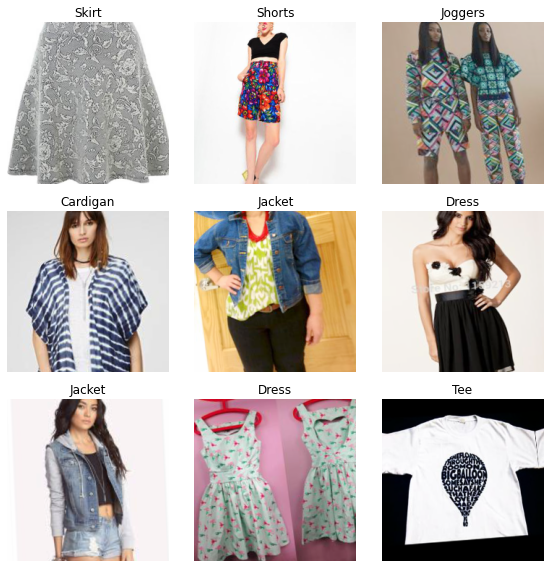

In [ ]:
root_path = '/content/drive/MyDrive/CMPE_256_PROJECT/images_unzip'
train_image_list = ImageList.from_df(df=data_df, path=root_path, cols='image_path').split_by_idxs(
    (data_df[data_df['dataset_type']=='train'].index),
    (data_df[data_df['dataset_type']=='val'].index)).label_from_df(cols='category')
    
test_image_list = ImageList.from_df(df=data_df[data_df['dataset_type'] == 'test'], path=root_path, cols='image_path')

data = train_image_list.transform(get_transforms(), size=224).databunch(bs=128).normalize(imagenet_stats)
data.add_test(test_image_list)
data.show_batch(rows=3, figsize=(8,8))

In [ ]:
data

ImageDataBunch;

Train: LabelList (209222 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
Blouse,Blouse,Blouse,Blouse,Blouse
Path: /content/drive/MyDrive/CMPE_256_PROJECT/images_unzip;

Valid: LabelList (40000 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
Blouse,Blouse,Blouse,Blouse,Blouse
Path: /content/drive/MyDrive/CMPE_256_PROJECT/images_unzip;

Test: LabelList (40000 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: EmptyLabelList
,,,,
Path: /content/drive/MyDrive/CMPE_256_PROJECT/images_unzip

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,top_k_accuracy,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 1.32E-02
Min loss divided by 10: 1.20E-02


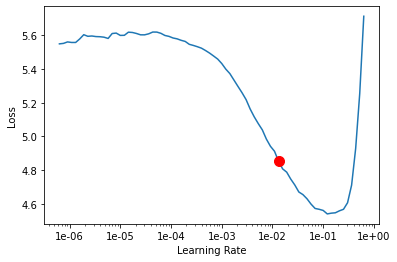

In [ ]:
def train_model(data, pretrained_model, model_metrics):
    learner = cnn_learner(data, pretrained_model, metrics=model_metrics)
    learner.model = torch.nn.DataParallel(learner.model)
    learner.lr_find()
    learner.recorder.plot(suggestion=True)
    return learner

pretrained_model = models.resnet18 # simple model that can be trained on free tier
# pretrained_model = models.resnet50 # need pro tier, model I used

model_metrics = [accuracy, partial(top_k_accuracy, k=1), partial(top_k_accuracy, k=5)]
learner = train_model(data, pretrained_model, model_metrics)

the LR Finder trains the model with exponentially growing learning rates from start_lr to end_lr for num_it and stops in case of divergence (unless stop_div=False) then plots the losses vs the learning rates with a log scale.


A variety of learning rate suggestion algorithms can be passed into the function, by default we use the valley paradigm.


In top-5 accuracy you give yourself credit for having the right answer if the right answer appears in your top five guesses.
link: https://stats.stackexchange.com/questions/95391/what-is-the-definition-of-top-n-accuracy

In [ ]:
learner.fit_one_cycle(10, max_lr=1e-02)

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,top_k_accuracy,time
0,1.612234,1.456226,0.575050,0.575050,0.881875,2:59:27
1,1.588643,1.512529,0.551825,0.551825,0.874650,16:06
2,1.576536,1.513705,0.555700,0.555700,0.870975,15:35
3,1.548986,1.439291,0.577400,0.577400,0.884050,15:35
4,1.517734,1.396733,0.591000,0.591000,0.892950,15:56
5,1.489872,1.346058,0.602950,0.602950,0.899525,15:44
6,1.402063,1.296037,0.616850,0.616850,0.905850,15:47
7,1.368171,1.270443,0.622950,0.622950,0.910275,15:43
8,1.356702,1.248458,0.630525,0.630525,0.913000,15:41
9,1.352320,1.245822,0.632200,0.632200,0.913550,15:44


Fit self.model for n_epoch using the 1cycle policy.

It schedules the learning rate with a cosine annealing from lr_max/div to lr_max then lr_max/div_final

Cosine Annealing is a type of learning rate schedule that has the effect of starting with a large learning rate that is relatively rapidly decreased to a minimum value before being increased rapidly again

In [ ]:
print (data_df['category'].unique())

#46 categories

['Blouse' 'Blazer' 'Button-Down' 'Bomber' 'Anorak' 'Tee' 'Tank' 'Top' 'Sweater' 'Flannel' 'Hoodie' 'Cardigan' 'Jacket'
 'Henley' 'Poncho' 'Jersey' 'Turtleneck' 'Parka' 'Peacoat' 'Halter' 'Skirt' 'Shorts' 'Jeans' 'Joggers' 'Sweatpants'
 'Jeggings' 'Cutoffs' 'Sweatshorts' 'Leggings' 'Culottes' 'Chinos' 'Trunks' 'Sarong' 'Gauchos' 'Jodhpurs' 'Capris'
 'Dress' 'Romper' 'Coat' 'Kimono' 'Jumpsuit' 'Robe' 'Caftan' 'Kaftan' 'Coverup' 'Onesie']


In [ ]:
#learner.save('/content/drive/MyDrive/CMPE_256_PROJECT/images_unzip/')

In [ ]:
def load_learner(data, pretrained_model, model_metrics, model_path):
    learner = cnn_learner(data, pretrained_model, metrics=model_metrics)
    learner.model = torch.nn.DataParallel(learner.model)
    learner = learner.load(model_path)
    return learner

pretrained_model = models.resnet18 

model_metrics = [accuracy, partial(top_k_accuracy, k=1), partial(top_k_accuracy, k=5)]
# # if gdrive not mounted:
# drive.mount('/content/gdrive') 


model_path = "/content/drive/MyDrive/CMPE_256_PROJECT/images_unzip/models/resnet-fashion"
learner = load_learner(data, pretrained_model, model_metrics, model_path)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

Classes to build objects to better interpret predictions of a model


ClassificationInterpretation.from_learner(learner)
: Interpretation methods for classification models.


plot_top_losses : Show images in top_losses along with their prediction, actual, loss, and probability of actual class.


link: https://fastai1.fast.ai/vision.learner.html#ClassificationInterpretation

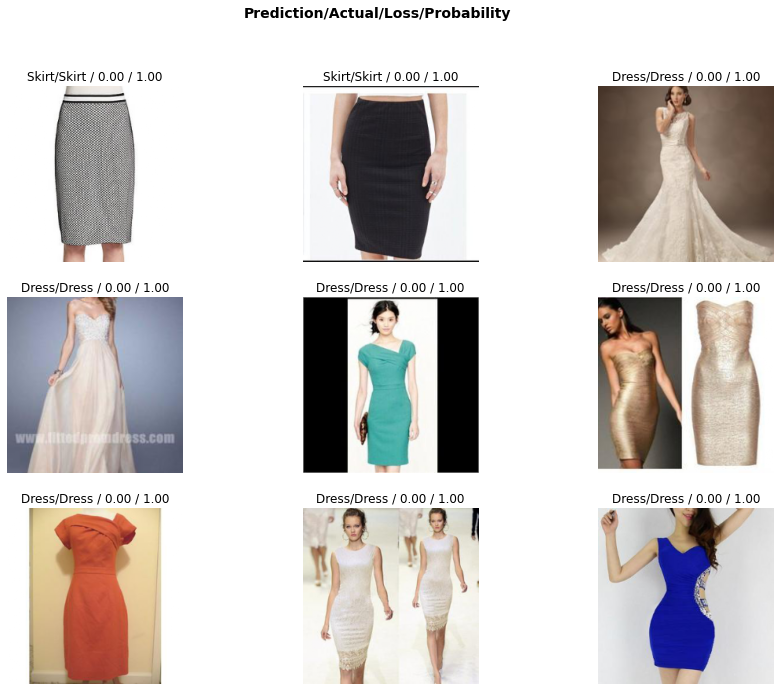

In [ ]:
interp = ClassificationInterpretation.from_learner(learner)
interp.plot_top_losses(9, largest=False, figsize=(15,11), heatmap_thresh=5)

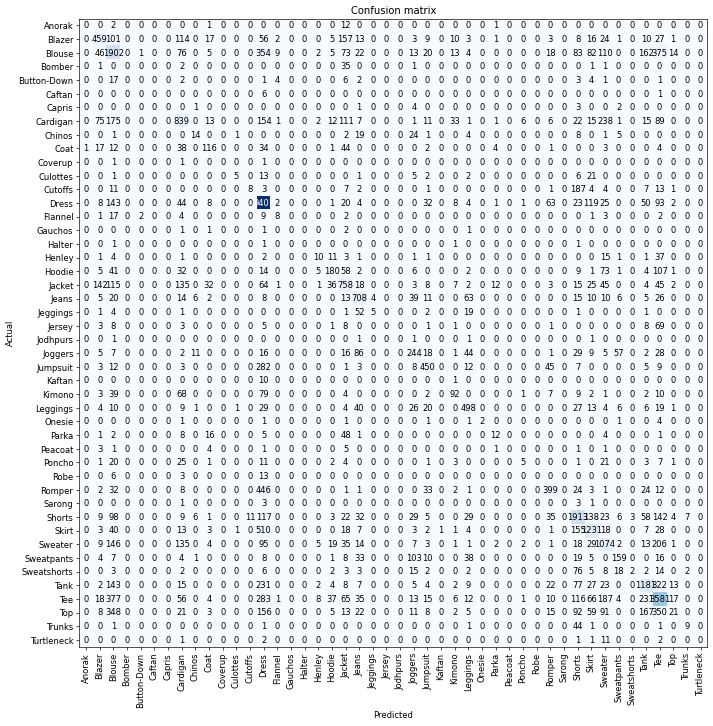

In [ ]:
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

**Get image feature vectors:**

In [ ]:
# .module because DataParallel was used
model = learner.model.module

In [ ]:
class Hook():
    "Create a hook on `m` with `hook_func`."
    def __init__(self, m:nn.Module, hook_func:HookFunc, is_forward:bool=True, detach:bool=True):
        self.hook_func,self.detach,self.stored = hook_func,detach,None
        f = m.register_forward_hook if is_forward else m.register_backward_hook
        self.hook = f(self.hook_fn)
        self.removed = False

    def hook_fn(self, module:nn.Module, input:Tensors, output:Tensors):
        "Applies `hook_func` to `module`, `input`, `output`."
        if self.detach:
            input  = (o.detach() for o in input ) if is_listy(input ) else input.detach()
            output = (o.detach() for o in output) if is_listy(output) else output.detach()
        self.stored = self.hook_func(module, input, output)

    def remove(self):
        "Remove the hook from the model."
        if not self.removed:
            self.hook.remove()
            self.removed=True

    def __enter__(self, *args): return self
    def __exit__(self, *args): self.remove()
        
def get_output(module, input_value, output):
    return output.flatten(1)

def get_input(module, input_value, output):
    return list(input_value)[0]

def get_named_module_from_model(model, name):
    for n, m in model.named_modules():
        if n == name:
            return m
    return None

In [ ]:
linear_output_layer = get_named_module_from_model(model, '1.4')
linear_output_layer

Linear(in_features=1024, out_features=512, bias=True)

In [ ]:
# getting all images in train
#image_path	dataset_type	category
images_path = '/content/drive/MyDrive/CMPE_256_PROJECT/images_unzip'
train_valid_images_df = data_df[data_df['dataset_type'] != 'test']
inference_data_source = (ImageList.from_df(df=train_valid_images_df, path=images_path, cols='image_path')
                    .split_none()
                    .label_from_df(cols='category')
              )

In [ ]:
tmfs = get_transforms()

inference_data = inference_data_source.transform(tmfs, size=224).databunch(bs=32).normalize(imagenet_stats)

In [ ]:
inference_dataloader = inference_data.train_dl.new(shuffle=False)

In [ ]:
import time
img_repr_map = {}

with Hook(linear_output_layer, get_output, True, True) as hook:
    start = time.time()
    for i, (xb, yb) in enumerate(inference_dataloader):
        bs = xb.shape[0]
        img_ids = inference_dataloader.items[i*bs: (i+1)*bs]
        result = model.eval()(xb)
        img_reprs = hook.stored.cpu().numpy()
        img_reprs = img_reprs.reshape(bs, -1)
        for img_id, img_repr in zip(img_ids, img_reprs):
            img_repr_map[img_id] = img_repr
        if(len(img_repr_map) % 12800 == 0):
            end = time.time()
            print(f'{end-start} secs for 12800 images')
            start = end

169.6478624343872 secs for 12800 images
147.74550008773804 secs for 12800 images
165.06402778625488 secs for 12800 images
180.49406337738037 secs for 12800 images
155.2185513973236 secs for 12800 images
155.8884756565094 secs for 12800 images
164.71392154693604 secs for 12800 images
168.14194011688232 secs for 12800 images
173.38046836853027 secs for 12800 images
166.8223376274109 secs for 12800 images
169.06113481521606 secs for 12800 images
172.7940709590912 secs for 12800 images
169.77832555770874 secs for 12800 images
186.89344549179077 secs for 12800 images
171.51990175247192 secs for 12800 images
173.14752292633057 secs for 12800 images
172.7837040424347 secs for 12800 images
182.28424882888794 secs for 12800 images
179.10077166557312 secs for 12800 images


In [ ]:
img_repr_df = pd.DataFrame(img_repr_map.items(), columns=['img_id', 'img_repr'])

In [ ]:
img_repr_df.shape

(249216, 2)

In [ ]:
img_repr_df['label'] = [inference_data.classes[x] for x in inference_data.train_ds.y.items[0:img_repr_df.shape[0]]]


In [ ]:
img_repr_df['label_id'] = inference_data.train_ds.y.items[0:img_repr_df.shape[0]]

In [ ]:
img_repr_df.head()

,img_id,img_repr,label,label_id
0,/content/drive/MyDrive/CMPE_256_PROJECT/images...,"[0.0, 0.0, 0.0, 0.0, 66.04271, 0.0, 0.0, 56.59...",Blouse,2
1,/content/drive/MyDrive/CMPE_256_PROJECT/images...,"[0.0, 0.0, 0.0, 0.0, 0.0, 35.313522, 0.0, 0.0,...",Blouse,2
2,/content/drive/MyDrive/CMPE_256_PROJECT/images...,"[0.0, 0.0, 0.0, 0.0, 42.789425, 14.990664, 0.0...",Blouse,2
3,/content/drive/MyDrive/CMPE_256_PROJECT/images...,"[7.648673, 0.0, 0.0, 0.0, 22.01857, 0.0, 0.0, ...",Blouse,2
4,/content/drive/MyDrive/CMPE_256_PROJECT/images...,"[0.0, 0.0, 0.0, 0.3381176, 47.580833, 0.0, 0.0...",Blouse,2


**Getting similar images with cosine distance**

In [ ]:
from scipy.spatial.distance import cosine

def get_similar_images(img_index, n=10):
    start = time.time()
    base_img_id, base_vector, base_label  = img_repr_df.iloc[img_index, [0, 1, 2]]
    cosine_similarity = 1 - img_repr_df['img_repr'].apply(lambda x: cosine(x, base_vector))
    similar_img_ids = np.argsort(cosine_similarity)[-11:-1][::-1]
    end = time.time()
    print(f'{end - start} secs')
    return base_img_id, base_label, img_repr_df.iloc[similar_img_ids]

def show_similar_images(similar_images_df):
    images = [open_image(img_id) for img_id in similar_images_df['img_id']]
    categories = [learner.data.train_ds.y.reconstruct(y) for y in similar_images_df['label_id']]
    return learner.data.show_xys(images, categories)

In [ ]:
base_image, base_label, similar_images_df = get_similar_images(0)

15.40455412864685 secs


Blouse
/content/drive/MyDrive/CMPE_256_PROJECT/images_unzip/img/Sheer_Pleated-Front_Blouse/img_00000001.jpg


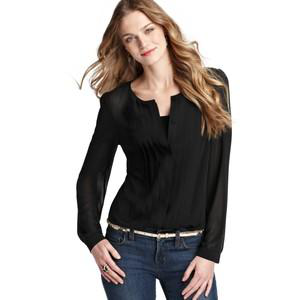

In [ ]:
print(base_label)
print(base_image)
open_image(base_image)

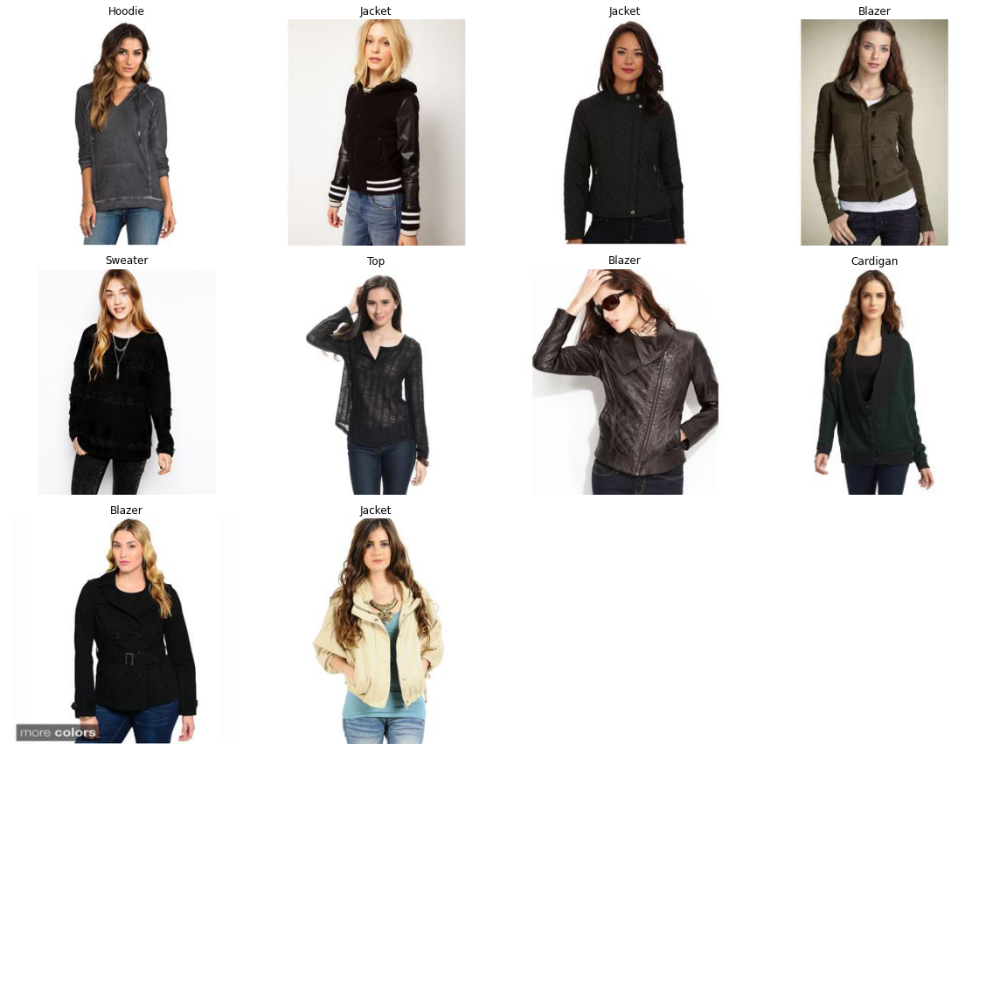

In [ ]:
show_similar_images(similar_images_df)

**TSNE plot**


The TSNE plot is a dimensionality reduction technique which is a way to graphically simplify very large datasets. Within seqmonk it can be used to cluster data stores on the basis of the current quantitation across a large number of probes.

-->With the TSNE plot you can put your mouse over any individual point, which will then cause the name of that point to be drawn under it so you can tell which point is which. 

-->You can also tick the labels box to see all sample labels (though this might get a bit messy). 

-->There is also an option to highlight any replicate sets you've made in the project so you can see if groups of data stores which you would expect to cluster together actually behave that way in your data.

In [ ]:
from sklearn.manifold import TSNE

img_repr_matrix = [list(x) for x in img_repr_df['img_repr'].values]
tsne = TSNE(n_components=3, verbose=10, init='pca', perplexity=30, n_iter=500, n_iter_without_progress=100)
tsne_results_3 = tsne.fit_transform(img_repr_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 249216 samples in 0.112s...
[t-SNE] Computed neighbors for 249216 samples in 1694.451s...
[t-SNE] Computed conditional probabilities for sample 1000 / 249216
[t-SNE] Computed conditional probabilities for sample 2000 / 249216
[t-SNE] Computed conditional probabilities for sample 3000 / 249216
[t-SNE] Computed conditional probabilities for sample 4000 / 249216
[t-SNE] Computed conditional probabilities for sample 5000 / 249216
[t-SNE] Computed conditional probabilities for sample 6000 / 249216
[t-SNE] Computed conditional probabilities for sample 7000 / 249216
[t-SNE] Computed conditional probabilities for sample 8000 / 249216
[t-SNE] Computed conditional probabilities for sample 9000 / 249216
[t-SNE] Computed conditional probabilities for sample 10000 / 249216
[t-SNE] Computed conditional probabilities for sample 11000 / 249216
[t-SNE] Computed conditional probabilities for sample 12000 / 249216
[t-SNE] Computed conditional prob

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


[t-SNE] Iteration 50: error = 107.8972015, gradient norm = 0.0003767 (50 iterations in 292.577s)
[t-SNE] Iteration 100: error = 107.4041214, gradient norm = 0.0002202 (50 iterations in 289.649s)
[t-SNE] Iteration 150: error = 107.0915146, gradient norm = 0.0001767 (50 iterations in 294.506s)
[t-SNE] Iteration 200: error = 106.8681641, gradient norm = 0.0001550 (50 iterations in 293.261s)
[t-SNE] Iteration 250: error = 106.7018127, gradient norm = 0.0001525 (50 iterations in 288.279s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 106.701813
[t-SNE] Iteration 300: error = 6.3856149, gradient norm = 0.0000858 (50 iterations in 267.135s)
[t-SNE] Iteration 350: error = 6.3756032, gradient norm = 0.0000554 (50 iterations in 266.275s)
[t-SNE] Iteration 400: error = 6.3643579, gradient norm = 0.0000449 (50 iterations in 266.095s)
[t-SNE] Iteration 450: error = 6.3531070, gradient norm = 0.0000369 (50 iterations in 266.023s)
[t-SNE] Iteration 500: error = 6.3426361, gradie

In [ ]:
img_repr_df['tsne1'] = tsne_results_3[:,0]
img_repr_df['tsne2'] = tsne_results_3[:,1]
img_repr_df['tsne3'] = tsne_results_3[:,2]

In [ ]:
img_repr_df.to_parquet('deepFashion_similar_images')

In [ ]:
!pip install plotly_express

In [ ]:
import plotly_express as px
px.scatter_3d(img_repr_df, x='tsne1', y='tsne2', z='tsne3', color='label')

**Using Annoy - Approximate Nearest Neighbors Oh Yeah!**

In [ ]:
!pip install annoy

     |████████████████████████████████| 646 kB 5.3 MB/s 
  Created wheel for annoy: filename=annoy-1.17.0-cp37-cp37m-linux_x86_64.whl size=391650 sha256=eeee4119e22a95fb80cb1846e56b00059f39ab56c9e5d4e6f16f5423dae38b89
  Stored in directory: /root/.cache/pip/wheels/4f/e8/1e/7cc9ebbfa87a3b9f8ba79408d4d31831d67eea918b679a4c07
Successfully built annoy


In [ ]:
from annoy import AnnoyIndex

In [ ]:
f = len(img_repr_df['img_repr'][0])
t = AnnoyIndex(f, metric='euclidean')

In [ ]:
for i, vector in enumerate(img_repr_df['img_repr']):
    t.add_item(i, vector)
_  = t.build(inference_data.c)

In [ ]:
def get_similar_images_annoy(img_index):
    start = time.time()
    base_img_id, base_vector, base_label  = img_repr_df.iloc[img_index, [0, 1, 2]]
    similar_img_ids = t.get_nns_by_item(img_index, 13)
    end = time.time()
    print(f'{(end - start) * 1000} ms')
    return base_img_id, base_label, img_repr_df.iloc[similar_img_ids[1:]]

In [ ]:
# 230000, 130000, 190000
base_image, base_label, similar_images_df_annoy = get_similar_images_annoy(149999)

2.0530223846435547 ms


Shorts


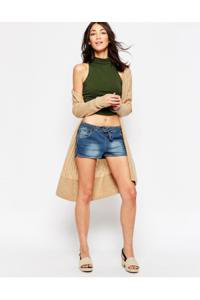

In [ ]:
print(base_label)
open_image(base_image)

In [ ]:
similar_images_df_annoy

,img_id,img_repr,label,label_id,tsne1,tsne2,tsne3
165400,/content/drive/MyDrive/CMPE_256_PROJECT/images...,"[0.0, 0.0, 0.0, 0.0, 26.40232, 16.577274, 0.0,...",Shorts,36,-111.868858,40.299793,184.711044
84291,/content/drive/MyDrive/CMPE_256_PROJECT/images...,"[0.0, 0.0, 0.0, 0.0, 25.445196, 24.803667, 0.0...",Tee,42,-90.899002,9.968020,190.750244
83289,/content/drive/MyDrive/CMPE_256_PROJECT/images...,"[10.985628, 0.0, 0.0, 0.0, 21.30529, 39.545444...",Top,43,-172.860092,3.600503,240.928726
28981,/content/drive/MyDrive/CMPE_256_PROJECT/images...,"[2.8642955, 0.0, 0.0, 0.0, 26.659872, 23.30776...",Tee,42,-107.264297,-5.009652,193.031982
126750,/content/drive/MyDrive/CMPE_256_PROJECT/images...,"[0.0, 0.0, 0.0, 0.0, 30.991713, 35.427505, 0.0...",Shorts,36,-141.543945,17.524092,190.205078
43225,/content/drive/MyDrive/CMPE_256_PROJECT/images...,"[0.0, 0.0, 0.0, 0.0, 11.885933, 9.561273, 0.0,...",Tee,42,-89.014572,-10.379736,218.791016
145614,/content/drive/MyDrive/CMPE_256_PROJECT/images...,"[0.0, 0.0, 0.0, 0.0, 16.142052, 8.606237, 0.0,...",Shorts,36,-109.892517,11.661685,206.620712
70222,/content/drive/MyDrive/CMPE_256_PROJECT/images...,"[0.23401666, 0.0, 0.0, 0.0, 32.703327, 35.1272...",Tee,42,-103.204430,18.853642,205.122101
48205,/content/drive/MyDrive/CMPE_256_PROJECT/images...,"[26.773533, 0.0, 0.0, 0.0, 17.192043, 50.735, ...",Tee,42,-95.047211,10.550536,186.209030
150694,/content/drive/MyDrive/CMPE_256_PROJECT/images...,"[0.0, 0.0, 0.0, 0.0, 19.316483, 8.985782, 0.0,...",Cutoffs,12,-112.670280,-34.316544,191.128555


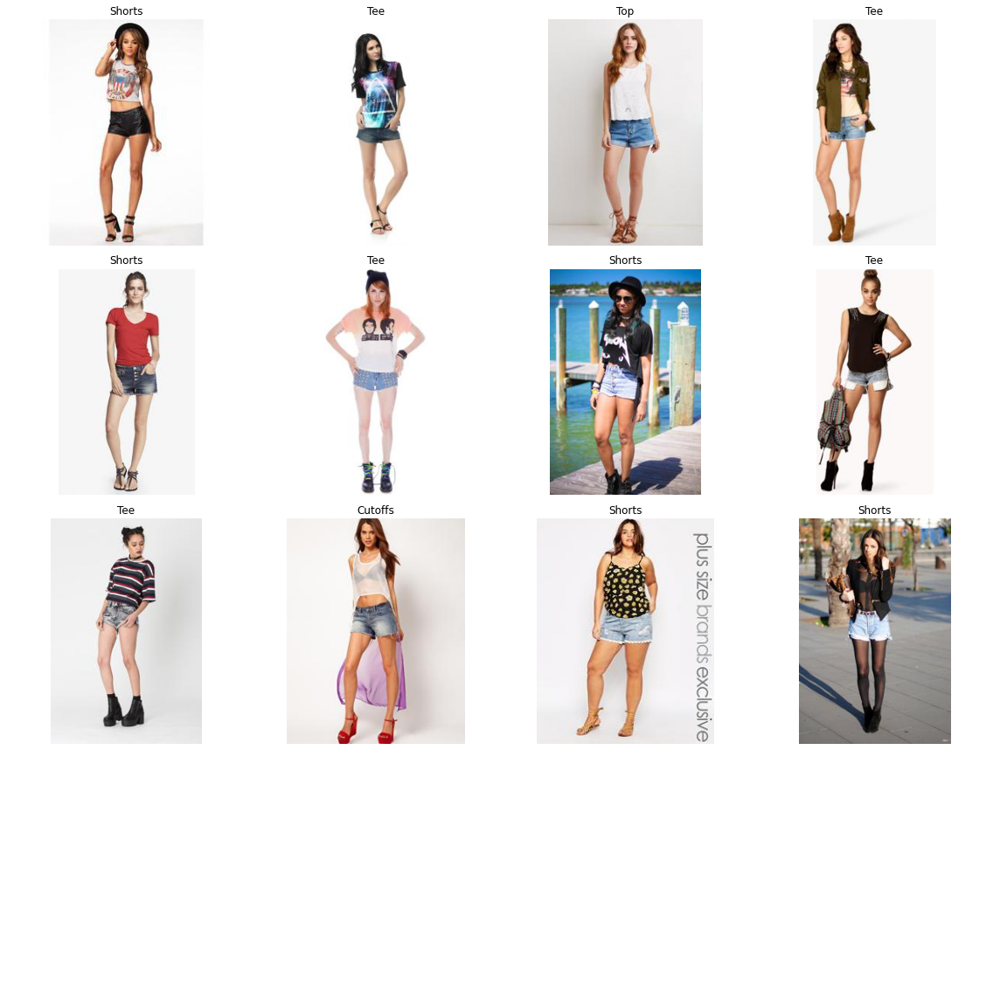

In [ ]:
show_similar_images(similar_images_df_annoy)